# Python Basics + Geospatial Visualization/Exploration

- Python data types
- Pandas fundamentals: Series and DataFrames
- Mapping with geopandas
- Plotting with matplotlib/pandas (and seaborn)
- Pivoting DataFrames
- US county demographics + maps
- Merging dataframes

### Load our basic libraries, create an environment if needed

- May need to create an new environment for local Python
- To create a new environment:

In [8]:
#To make a new environment and install packages in the termicnal:
#For your reference:

#conda create -n my_env
#conda activate my_env
#conda config --env --add channels conda-forge
#conda config --env --set channel_priority strict
#conda install <my_package>

In [1]:
#Some standard libraries
import matplotlib.pyplot as plt
import pandas as pd 
import numpy as np

#And geopandas
import geopandas as gpd

## A note on Python types:

### Python Scalar Types

There are several basic single value *scalar* types in the standard Python library:


| Type | Description |
| :- | :- |
| `None` | NULL, Only a single instance of `None` exists
| `str` | String, UTF-8 encoded strings
| `bytes` | Raw ASCII bytes
| `float` | Double-precision (64-bit) float (no separate `double` type)
| `int` | Arbitrary precision signed integer
| `bool` | `True` or `False` boolean

**Scalar types are always *immutable***

In [4]:
a = 1+1
a



2

## Advanced variable types

- Lists
- Dictionaries
- Tuples

### Lists

Lists are an ordered array-like structure that is *mutable*. List elements can be of any type, including other lists, dictionary, and tuples

In [1]:
#Declare a list like so:
L = [3, 5, 9.2, 'oye', ['a', 'b', 8.8, [1, 2,3]]] #Note the list as the last element of L

print(L)
type(L)

[3, 5, 9.2, 'oye', ['a', 'b', 8.8, [1, 2, 3]]]


list

#### List Comprehensions

The basic form of a list comprehension is:

```
[expr for val in collection if condition]
```

Which is equivalent to:

```
result = []
for val in collection:
    if condition:
        result.append(expr)
```

Don't necessarily need the condition, in which case we just append vals all together.

In [2]:
#Create a new array of the even values, squared:
#C-style:
x = list(range(1,10))

y = []
for i in x:
    if (i % 2 == 0):
        y.append(i**2)

y

[4, 16, 36, 64]

In [3]:
#Python style:
y = [i**2 for i in range(1,10) if i % 2 == 0]
y

[4, 16, 36, 64]

### Dictionaries

Dictionaries are mutable list-like objects, declared using curly {}, define a set of key/value pairs

In [4]:
#Make a dictionary
my_dict = {'thing1':12.3, 'thing2':14, 'cat':'hat', 'yurtle':'turtle', 5:42}
my_dict

{'thing1': 12.3, 'thing2': 14, 'cat': 'hat', 'yurtle': 'turtle', 5: 42}

In [5]:
#Get by key
my_dict['thing1']

12.3

### Tuples

Tuples are ordered, *immutable* array-like objects.

In [6]:
#And a quick tuple:
t = (1, 3, 'test', 9, [1,2,3])
t

(1, 3, 'test', 9, [1, 2, 3])

# Pandas

- The `pandas` library is our fundamental library for working with tabular data/data frames.

- pandas is often used with numerical computing tools NumPy and SciPy, analytical libraries like scikit-learn, and data visualization libraries such as matplotlib

- Adopts parts of NumPy's style for array-based computing and data processing without `for` loops

## Series

The two fundamental data structures in pandas are the

1. **Series**
2. **DataFrame**

A **Series** is a 1-D array-like object consisting of a sequence of values (types similar to NumPy types) + an array of data labels called its ***index***

In [11]:
s = pd.Series([1,3,5,7,9], index=list("abcde")) #, dtype=np.float64)
s


a    1
b    3
c    5
d    7
e    9
dtype: int64

### To index, we use `iloc` and `loc`:

- Strongly recommended for Series
- Must use for DataFrames

#### `iloc` is the integer index:

In [12]:
s.iloc[0:2]

a    1
b    3
dtype: int64

In [13]:
s.iloc[[0,2,3]]

a    1
c    5
d    7
dtype: int64

#### `loc` uses the index

In [14]:
s.loc[['a', 'c']]

a    1
c    5
dtype: int64

In [15]:
s.loc['a':'c']

a    1
b    3
c    5
dtype: int64

In [16]:
#But note the difference:
s.iloc[0:2]

a    1
b    3
dtype: int64

### Boolean Masking

**Note that masking, filtering, scalar multiplication, and math functions all preserve index-value link**

In [17]:
#Generate boolean Series:
s > 3

a    False
b    False
c     True
d     True
e     True
dtype: bool

In [18]:
#And mask:
s[s > 3]

c    5
d    7
e    9
dtype: int64

In [19]:
#Or (better):
s.loc[s > 3]

c    5
d    7
e    9
dtype: int64

### Arithmetic and universal functions:

- Similar to NumPy
- *Arithmetic operations between series automatically align by index label!*


In [20]:
s * 3

a     3
b     9
c    15
d    21
e    27
dtype: int64

In [21]:
np.exp(s)

a       2.718282
b      20.085537
c     148.413159
d    1096.633158
e    8103.083928
dtype: float64

In [22]:
#Note index alignment:

#Leave off e here:
s2 = pd.Series([1, 3, 5, 7], index = list(reversed('abcd')))

s2

d    1
c    3
b    5
a    7
dtype: int64

In [23]:
s + s2

a    8.0
b    8.0
c    8.0
d    8.0
e    NaN
dtype: float64

In [24]:
s * s2

a     7.0
b    15.0
c    15.0
d     7.0
e     NaN
dtype: float64

In [26]:
#To only keep the ones that aren't NaN:
(s + s2).dropna()


a    8.0
b    8.0
c    8.0
d    8.0
dtype: float64

In [27]:
#Also note:
(s + s2).isna()

a    False
b    False
c    False
d    False
e     True
dtype: bool

In [28]:
#And:
(s + s2).notnull()

a     True
b     True
c     True
d     True
e    False
dtype: bool

In [29]:
#any
(s + s2).notnull().any()

True

In [30]:
#and all
(s + s2).notnull().all()

False

## DataFrame

Rectangular table of data, where each column can be a different data type.

- Both row and column index

- Could also think of as a dictionary of Series that all share the same index

Example:

In [31]:
#Let's make a DataFrame from a dictionary of equal-length lists:
#Index is assigned automatically if we don't specify

#Principal Crops Area Planted
#USDA Acreage Report
#https://usda.library.cornell.edu/concern/publications/j098zb09z?locale=en

data = {'state': ['Arizona', 'Arizona', 'Arizona', 'Arizona',
                  'California', 'California', 'California', 'California', 'Iowa', 'Iowa', 'Iowa', 'Iowa'],
        'year': [2019, 2020, 2021, 2022, 2019, 2020, 2021, 2022, 2019, 2020, 2021, 2022],
        'area planted': [637, 573, 616, 630, 2983, 2621, 2550, 2274, 23935, 24330, 24330, 24150]}
        
df = pd.DataFrame(data,
                  index = ['one', 'two', 'three', 'four', 'five', 'six', 'seven', 'eight', 'nine', 'ten', 'eleven', 'twelve'])

df

,state,year,area planted
one,Arizona,2019,637
two,Arizona,2020,573
three,Arizona,2021,616
four,Arizona,2022,630
five,California,2019,2983
six,California,2020,2621
seven,California,2021,2550
eight,California,2022,2274
nine,Iowa,2019,23935
ten,Iowa,2020,24330


### Selection with loc and iloc

Select subsets of rows and columns using either axis labels (`loc`) or integer index (`iloc`)
- `loc`: Strictly label-based access
- `iloc`: Strictly integer-based access

In [32]:
df.loc['one':'four']

,state,year,area planted
one,Arizona,2019,637
two,Arizona,2020,573
three,Arizona,2021,616
four,Arizona,2022,630


In [34]:
#Same thing:
df.loc['one':'four', ['state', 'year']]

#Or
df.loc['one':'four'][['state', 'year']]


,state,year
one,Arizona,2019
two,Arizona,2020
three,Arizona,2021
four,Arizona,2022


In [38]:
#Get all rows of a column: Can get as a Series or a DataFrame:
#df.loc[:, 'state']

#Or just:
df['state']

#Vs:
#df.loc[:, ['state']]

one          Arizona
two          Arizona
three        Arizona
four         Arizona
five      California
six       California
seven     California
eight     California
nine            Iowa
ten             Iowa
eleven          Iowa
twelve          Iowa
Name: state, dtype: object

In [39]:
#Using iloc:

#Rows:
df.iloc[0:3] #or df.iloc[0:3, :]


,state,year,area planted
one,Arizona,2019,637
two,Arizona,2020,573
three,Arizona,2021,616


In [40]:
#Columns
df.iloc[:, 1:3]

,year,area planted
one,2019,637
two,2020,573
three,2021,616
four,2022,630
five,2019,2983
six,2020,2621
seven,2021,2550
eight,2022,2274
nine,2019,23935
ten,2020,24330


In [41]:
#Or subset like so:
df.iloc[0:3, 1:3]

,year,area planted
one,2019,637
two,2020,573
three,2021,616


In [44]:
#We can also revert to a numerical index (drop the resulting column)
#######

df = df.reset_index(drop=True)

df

,state,year,area planted
0,Arizona,2019,637
1,Arizona,2020,573
2,Arizona,2021,616
3,Arizona,2022,630
4,California,2019,2983
5,California,2020,2621
6,California,2021,2550
7,California,2022,2274
8,Iowa,2019,23935
9,Iowa,2020,24330


### Some Basic Filtering, Selecting

In [45]:
#Now we have:
df

,state,year,area planted
0,Arizona,2019,637
1,Arizona,2020,573
2,Arizona,2021,616
3,Arizona,2022,630
4,California,2019,2983
5,California,2020,2621
6,California,2021,2550
7,California,2022,2274
8,Iowa,2019,23935
9,Iowa,2020,24330


In [46]:
#Can apply boolean masking to DataFrames/Series:
########

df['area planted'] > 1000


0     False
1     False
2     False
3     False
4      True
5      True
6      True
7      True
8      True
9      True
10     True
11     True
Name: area planted, dtype: bool

In [47]:
#And filter based on the mask:
########

df.loc[df['area planted'] > 1000]

,state,year,area planted
4,California,2019,2983
5,California,2020,2621
6,California,2021,2550
7,California,2022,2274
8,Iowa,2019,23935
9,Iowa,2020,24330
10,Iowa,2021,24330
11,Iowa,2022,24150


In [48]:
#How many entries satisfied the condition?
########

#One way:
(df['area planted'] > 1000).sum()

8

In [54]:
#More than one condition?
########

#This way: For *and*:
df.loc[(df['area planted'] > 1000) & (df['area planted'] < 3000)]

#NOT this way:
#df.loc[df['area planted'] > 1000 & df['area planted'] < 3000]

#And NOT this way:
#df.loc[(df['area planted'] > 1000) and (df['area planted'] < 3000)]


,state,year,area planted
4,California,2019,2983
5,California,2020,2621
6,California,2021,2550
7,California,2022,2274


In [56]:
#For *or*:

df.loc[(df['area planted'] < 1000) | (df['area planted'] > 3000)]

,state,year,area planted
0,Arizona,2019,637
1,Arizona,2020,573
2,Arizona,2021,616
3,Arizona,2022,630
8,Iowa,2019,23935
9,Iowa,2020,24330
10,Iowa,2021,24330
11,Iowa,2022,24150


In [59]:
#Value in a list?
#######

df.loc[df['year'].isin([2019, 2021])]

,state,year,area planted
0,Arizona,2019,637
2,Arizona,2021,616
4,California,2019,2983
6,California,2021,2550
8,Iowa,2019,23935
10,Iowa,2021,24330


In [60]:
#NOT in a list?
#######

df.loc[~df['year'].isin([2019, 2021])]

,state,year,area planted
1,Arizona,2020,573
3,Arizona,2022,630
5,California,2020,2621
7,California,2022,2274
9,Iowa,2020,24330
11,Iowa,2022,24150


In [62]:
#Just certain columns?
########

df.loc[~df['year'].isin([2019, 2020])][['area planted', 'year']] #Try .sum() or .cumsum()

,area planted,year
2,616,2021
3,630,2022
6,2550,2021
7,2274,2022
10,24330,2021
11,24150,2022


In [63]:
## Sorting?

df.sort_values(by = ['year'])

,state,year,area planted
0,Arizona,2019,637
4,California,2019,2983
8,Iowa,2019,23935
1,Arizona,2020,573
5,California,2020,2621
9,Iowa,2020,24330
2,Arizona,2021,616
6,California,2021,2550
10,Iowa,2021,24330
3,Arizona,2022,630


In [64]:
#Descending:
df.sort_values(by = ['year', 'area planted'], ascending=False)

,state,year,area planted
11,Iowa,2022,24150
7,California,2022,2274
3,Arizona,2022,630
10,Iowa,2021,24330
6,California,2021,2550
2,Arizona,2021,616
9,Iowa,2020,24330
5,California,2020,2621
1,Arizona,2020,573
8,Iowa,2019,23935


# Some basic mapping with geopandas!

Let's read the lowres Natural Earth global map built into (earlier) geopandas and explore...


In [65]:
#Basic geopandas: First let's load some very basic Natural Earth data
#####################

#First, load the basic data from Natural Earth
#"gdf" is a common generic variable name = GeoDataFrame

gdf = gpd.read_file('World_Map/World_Map.shp') #(gpd.datasets.get_path('naturalearth_lowres'))



In [72]:
## We have?
#gdf.head(10)

gdf.tail()

gdf

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025..."
4,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312..."
...,...,...,...,...,...,...
172,6944975.0,Europe,Serbia,SRB,51475,"POLYGON ((18.82982 45.90887, 18.82984 45.90888..."
173,622137.0,Europe,Montenegro,MNE,5542,"POLYGON ((20.0707 42.58863, 19.80161 42.50009,..."
174,1794248.0,Europe,Kosovo,-99,7926,"POLYGON ((20.59025 41.85541, 20.52295 42.21787..."
175,1394973.0,North America,Trinidad and Tobago,TTO,24269,"POLYGON ((-61.68 10.76, -61.105 10.89, -60.895..."


In [73]:
## Recall filtering, sorting, etc.:

gdf.loc[gdf.continent == 'Africa'].sort_values(by='pop_est', ascending=False).head(10) #.plot()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
56,200963599.0,Africa,Nigeria,NGA,448120,"POLYGON ((2.6917 6.25882, 2.74906 7.87073, 2.7..."
165,112078730.0,Africa,Ethiopia,ETH,95912,"POLYGON ((47.78942 8.003, 44.9636 5.00162, 43...."
163,100388073.0,Africa,Egypt,EGY,303092,"POLYGON ((36.86623 22, 32.9 22, 29.02 22, 25 2..."
11,86790567.0,Africa,Dem. Rep. Congo,COD,50400,"POLYGON ((29.34 -4.49998, 29.51999 -5.41998, 2..."
25,58558270.0,Africa,South Africa,ZAF,351431,"POLYGON ((16.34498 -28.57671, 16.82402 -28.082..."
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
13,52573973.0,Africa,Kenya,KEN,95503,"POLYGON ((39.20222 -4.67677, 37.7669 -3.67712,..."
168,44269594.0,Africa,Uganda,UGA,35165,"POLYGON ((33.90371 -0.95, 31.86617 -1.02736, 3..."
82,43053054.0,Africa,Algeria,DZA,171091,"POLYGON ((-8.6844 27.39574, -8.66512 27.58948,..."
14,42813238.0,Africa,Sudan,SDN,30513,"POLYGON ((24.56737 8.22919, 23.80581 8.66632, ..."


<Axes: >

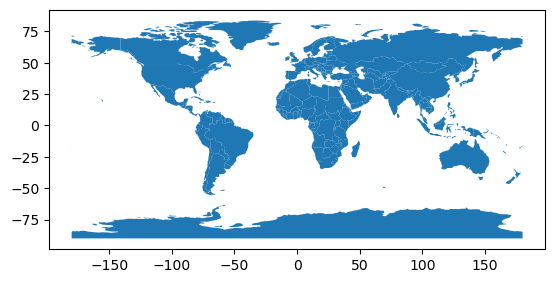

In [74]:
#And the simplest plot ever:
gdf.plot()

#### Slightly less basic map

The following code uses matplotlib to creates an Axes object, plots the world, and colors by population using the jet colormap.

<Axes: >

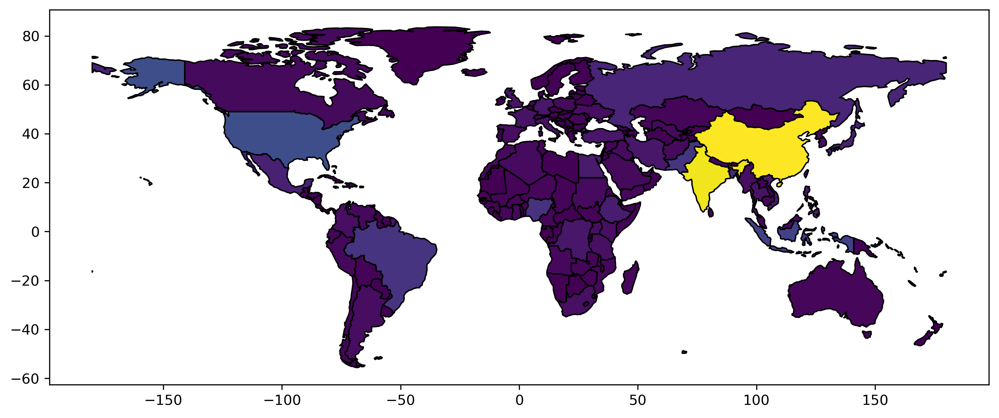

In [85]:

#Make subplots, just 1 x 1 for now, but can adapt format
fig1, ax1 = plt.subplots(1, 1, figsize=(12,8), dpi=300)

#Plot...Note that default column for plotting is just the index, so essentially random coloring
#Here we set to pop_est
gdf.plot(ax=ax1, edgecolor='black', column='pop_est', cmap='viridis') #, scheme='quantiles', k=10);


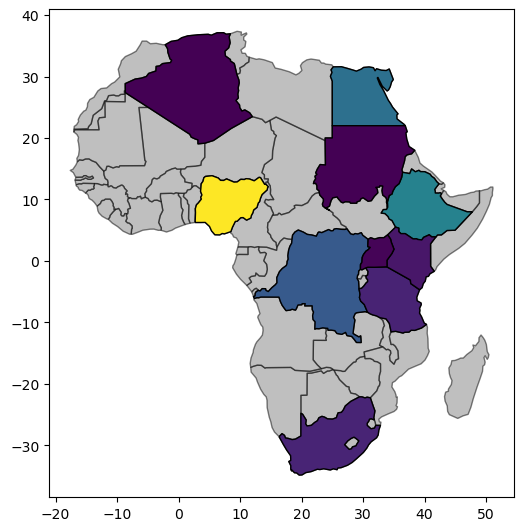

In [80]:
##Or, say:
##########

fig1, ax1 = plt.subplots(1, 1, figsize=(6,8)) #, dpi=300)

#Get this as a new GeoDataFrame:
top10_gdf = gdf.loc[gdf.continent == 'Africa'].sort_values(by='pop_est', ascending=False).head(10)

#Some background:
gdf.loc[gdf.continent == 'Africa'].plot(ax=ax1, edgecolor='black', facecolor='grey', alpha=.5);

#And:
top10_gdf.plot(ax=ax1, column='pop_est', edgecolor='black');


### Some simple plotting examples:

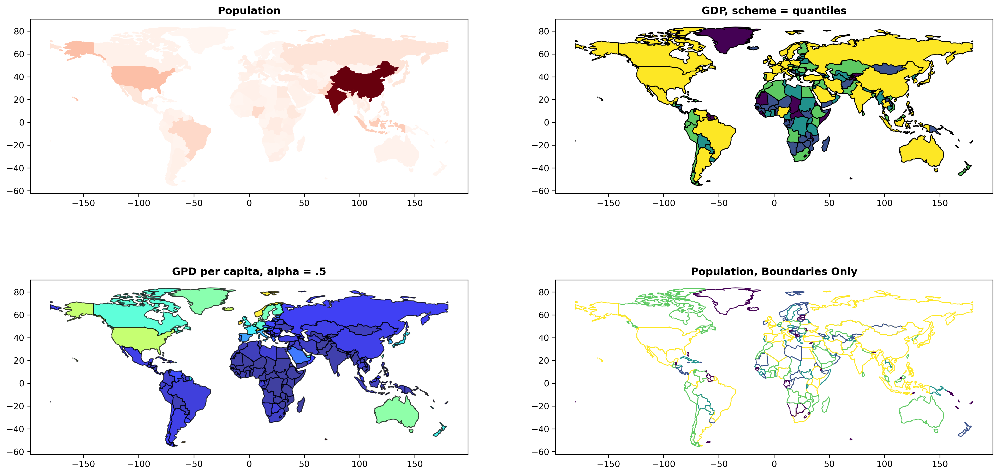

In [81]:
#Some basic plotting stuff
####################

# Get our map again:
# gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf = gpd.read_file('World_Map/World_Map.shp')


#Exclude Antarctica
gdf = gdf.loc[gdf.continent!='Antarctica']


#Make a gpd per capita column:
gdf['gpd_per_cap'] = gdf.gdp_md_est / gdf.pop_est



fig, ax1 = plt.subplots(2,2, figsize=(20, 10), dpi=300) #Can make dpi higher than default for prettier pictures
   
#This makes subplot indexing easier:
ax1 = ax1.flatten()



gdf.plot(ax = ax1[0], column = 'pop_est', linewidth = 1, edgecolor = 'face', cmap = 'Reds')
ax1[0].set_title('Population', fontweight='bold')


gdf.plot(ax = ax1[1], column = 'gdp_md_est', linewidth = 1, edgecolor = 'black', cmap = 'viridis',
         scheme='quantiles', k=5)
ax1[1].set_title('GDP, scheme = quantiles', fontweight='bold')


gdf.plot(ax = ax1[2], column = 'gpd_per_cap', linewidth = 1, edgecolor = 'black', cmap = 'jet', alpha = .75)
ax1[2].set_title('GPD per capita, alpha = .5', fontweight='bold')


gdf.plot(ax = ax1[3], facecolor = 'none', column = 'pop_est', linewidth = 1, cmap = 'viridis',
         scheme='quantiles')
ax1[3].set_title('Population, Boundaries Only', fontweight='bold');


<Axes: >

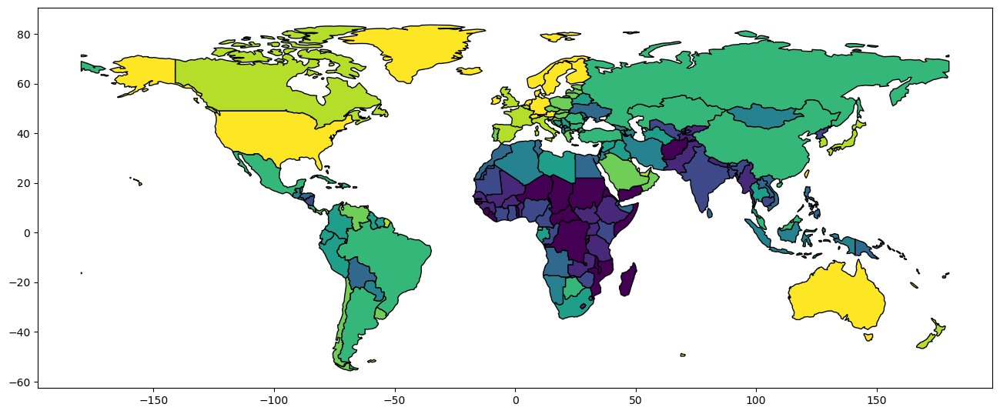

In [82]:
#Note, we don't actually need to create a new column/variable if we want a derived variable:
#Note also vmax and vmin
#####

gdf.plot(figsize=(16,8), column = gdf.gdp_md_est / gdf.pop_est, linewidth = 1, edgecolor = 'black', cmap = 'viridis',
         scheme='quantiles', k=10) 

<Axes: >

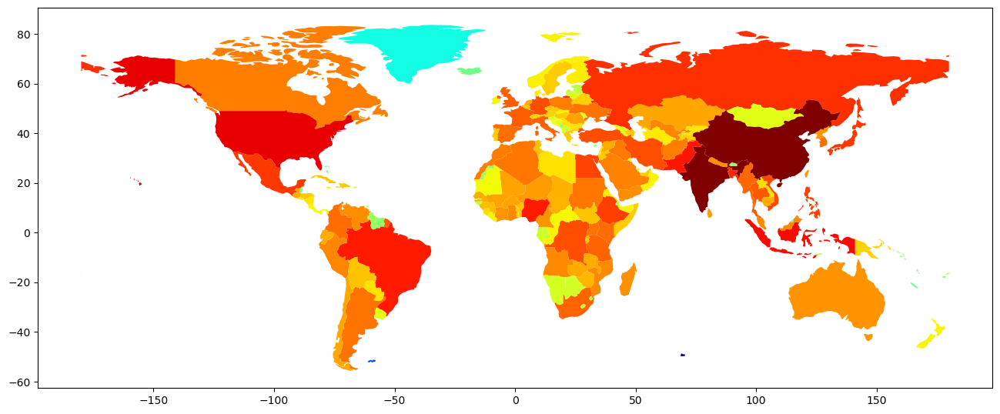

In [84]:
#Log scale
###########

gdf.plot(figsize=(16,8), column = np.log10(gdf.pop_est), linewidth = 1, edgecolor = 'none', cmap = 'jet')

## Add a (Pretty) Colorbar

- To add a colorbar, we can just do the following, but it won't necessarily be very pretty:

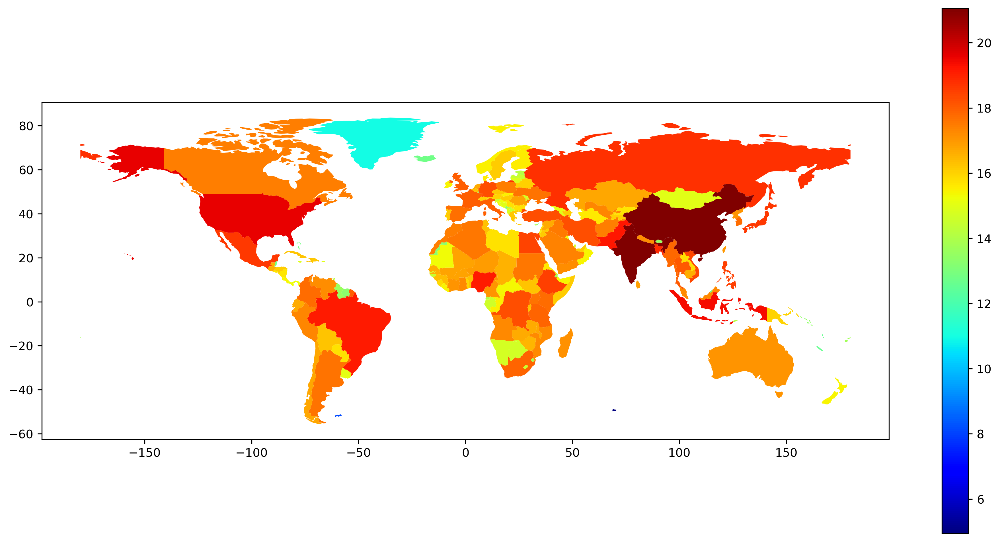

In [86]:
fig, ax1 = plt.subplots(1,1, figsize=(16, 8), dpi=300)

gdf.plot(ax=ax1, column = np.log(gdf.pop_est), linewidth = 1, edgecolor = 'none', cmap = 'jet', legend=True);

#### Make it pretty!

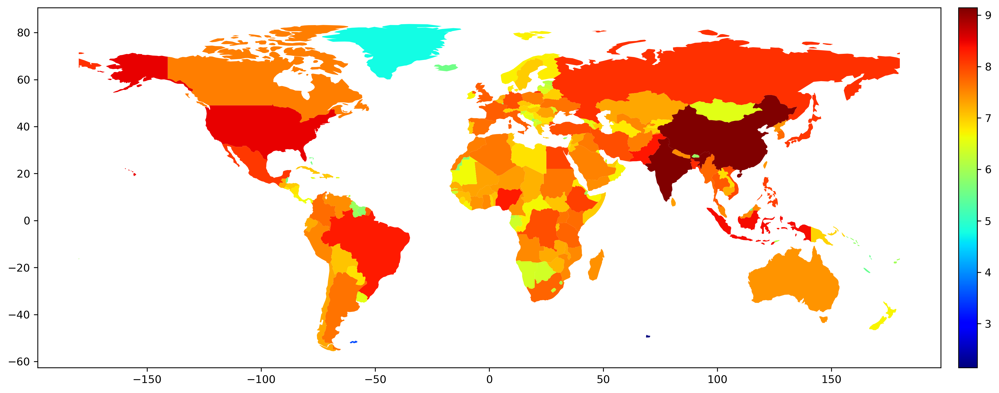

In [88]:
#For the pretty colorbar:
#####

from mpl_toolkits.axes_grid1 import make_axes_locatable


fig, ax1 = plt.subplots(1, 1, figsize=(16, 12), dpi=300)


#Set up our axis for the colorbar:
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="2%", pad=.05)

#And like so:
gdf.plot(ax=ax1, column = np.log10(gdf.pop_est), linewidth = 1, edgecolor = 'none', cmap = 'jet',
         legend=True, cax=cax);


### Missing Data?

No data, no problem...

In [89]:
#We'll use:
np.random.choice(gdf.index, 20)

array([132, 128, 107, 139,  88, 130,  60, 137,  87,  48, 126, 149,   8,
        48,  75,  79,  22,  12,  34,  94], dtype=int64)

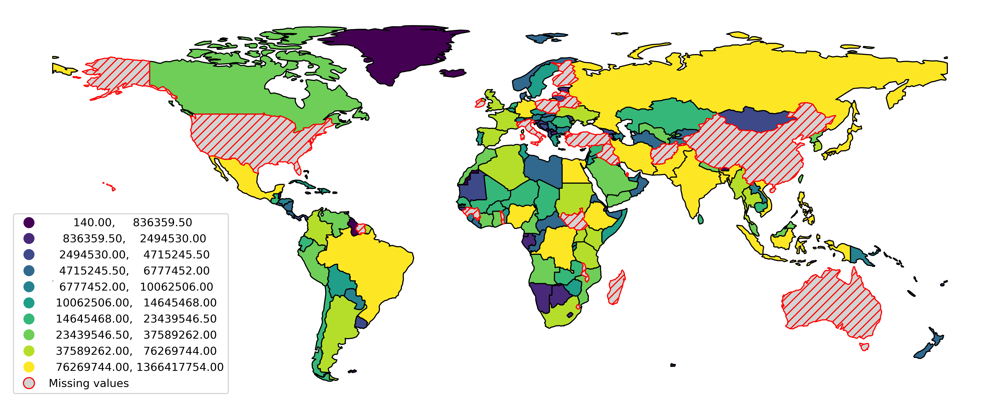

In [94]:
#Let's plot with some random counties NaNed
#gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf = gpd.read_file('World_Map/World_Map.shp')


#Exclude Antarctica
gdf = gdf.loc[gdf.continent != 'Antarctica']


#Take 20 countries, set population to nan
gdf.loc[np.random.choice(gdf.index, 20), 'pop_est'] = np.nan


fig, ax1 = plt.subplots(1,1, figsize=(16, 12), dpi=300)

#Note: scheme + k
#edgecolor: "black", etc. vs. "face"
#missing_kwds, legend, and legend_kwds

gdf.plot(ax=ax1, scheme="quantiles", k = 10, column = 'pop_est', linewidth = 1, edgecolor = 'black',
           missing_kwds={"color": "lightgrey", "edgecolor": "red", "hatch": "///", "label": "Missing values"},
           legend = True, legend_kwds={'loc': 'lower left'}) 


#Plus some axis stuff
####################

#ax1.get_xaxis().set_ticks([])
#ax1.get_yaxis().set_ticks([])

#Or could just:
ax1.set_axis_off();


#### Let's plot individual continents with subplots

In [95]:
#First, note the total_bounds for our GeoDataFrame:

gdf.total_bounds

array([-180.     ,  -55.61183,  180.     ,   83.64513])

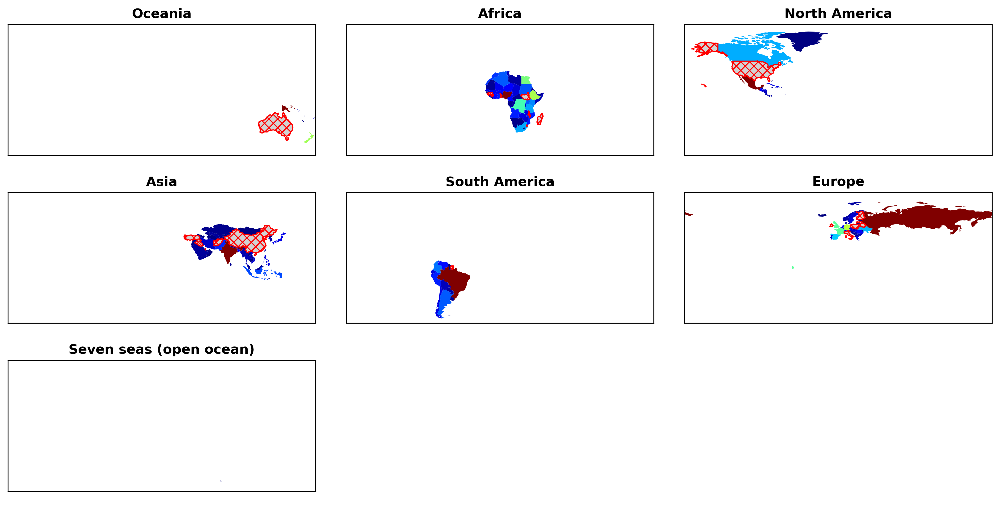

In [98]:
#Let's plot each continent in its own subfigure
#Have 8 continents, including open ocean (though we excluded antarctica earlier

fig, ax1 = plt.subplots(3,3, figsize=(16, 8), dpi=300)

#This make indexing more convenient:
ax1 = ax1.flatten()


#Pythonic iteration though the continents
#######
for i, c in enumerate(gdf.continent.unique()):

    #Plot...
    gdf.loc[gdf['continent'] == c].plot(ax = ax1[i], column = 'pop_est', cmap = 'jet',
                                       missing_kwds={"color": "lightgrey", "edgecolor": "red", "hatch": "///\\\\\\"})

    #Set title
    ax1[i].set_title(c, fontweight='bold')
    
    
    #Can do this vs. not:
    if (1):
        #Let's set x and y lim to the overall gdf bounds
        #Unpack:
        x1, y1, x2, y2 = gdf.total_bounds

        #And set horizontal:
        ax1[i].set_xlim([x1, x2])

        #Give a little extra vertical:
        ax1[i].set_ylim([y1*1.1, y2*1.1])

        #Still note quite the same box:
        #Final fix is to set the aspect ratio:
        ax1[i].set_aspect(1) #('equal')


    #Remove the tick markers
    ax1[i].set_xticks([])
    ax1[i].set_yticks([])

    
    
#Get rid of the last few plots:
ax1[7].set_axis_off()
ax1[8].set_axis_off()

#We can finally make our subplots a little closer together if desired:
plt.subplots_adjust(hspace=0.1, wspace=0.1)

## Dissolves (and groupby)

- We can dissolve our geometries into a single object based on some attribute

- Use `dissolve()` method; calls Pandas `groupby()`

- Use `by = ` to specify attribute


#### Need to specificy `aggfunc`

Adopted from: https://geopandas.org/en/stable/docs/user_guide/aggregation_with_dissolve.html

Default is `first`. Our options include:

- `first`


- `last`


- `min`


- `max`


- `sum`


- `mean`


- `median`


- function


- string function name


- list of functions and/or function names, e.g. [np.sum, `mean`]


- **dict of axis labels -> functions, function names or list of such.**


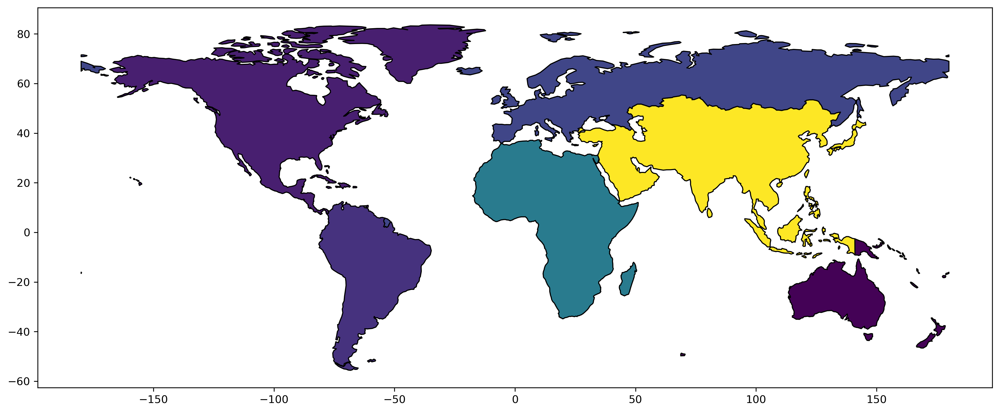

In [99]:
### Let's dissolve by continent, and take the sum:
########

gdf_continent = gdf.dissolve(by = 'continent', aggfunc = 'sum', numeric_only=True)


## Plot results
fig, ax1 = plt.subplots(1,1, figsize=(16, 12), dpi=300)

gdf_continent.plot(ax=ax1, column = 'pop_est', linewidth = 1, edgecolor = 'black');

In [100]:
#Note that continent is now the index:
gdf_continent

,geometry,pop_est,gdp_md_est
continent,,,
Africa,"MULTIPOLYGON (((-11.43878 6.78592, -11.70819 6...",1.227708e+09,2455514
Asia,"MULTIPOLYGON (((48.67923 14.0032, 48.23895 13....",2.988949e+09,32725478
Europe,"MULTIPOLYGON (((-53.55484 2.3349, -53.77852 2....",6.253028e+08,21587850
North America,"MULTIPOLYGON (((-155.22217 19.23972, -155.5421...",2.555165e+08,25075988
Oceania,"MULTIPOLYGON (((147.91405 -43.21152, 147.56456...",1.584057e+07,1647113
Seven seas (open ocean),"POLYGON ((68.935 -48.625, 69.58 -48.94, 70.525...",1.400000e+02,16
South America,"MULTIPOLYGON (((-68.63999 -55.58002, -69.2321 ...",4.264853e+08,3852015


In [101]:
## Could reset:
gdf_continent.reset_index()


,continent,geometry,pop_est,gdp_md_est
0,Africa,"MULTIPOLYGON (((-11.43878 6.78592, -11.70819 6...",1.227708e+09,2455514
1,Asia,"MULTIPOLYGON (((48.67923 14.0032, 48.23895 13....",2.988949e+09,32725478
2,Europe,"MULTIPOLYGON (((-53.55484 2.3349, -53.77852 2....",6.253028e+08,21587850
3,North America,"MULTIPOLYGON (((-155.22217 19.23972, -155.5421...",2.555165e+08,25075988
4,Oceania,"MULTIPOLYGON (((147.91405 -43.21152, 147.56456...",1.584057e+07,1647113
5,Seven seas (open ocean),"POLYGON ((68.935 -48.625, 69.58 -48.94, 70.525...",1.400000e+02,16
6,South America,"MULTIPOLYGON (((-68.63999 -55.58002, -69.2321 ...",4.264853e+08,3852015


## Note: `groupby` with regular ole' pandas

1. *Split* DataFrame into groups based on one or more *keys*, along a particular axis (rows, `axis = 0`; or colums, `axis = 1`)
2. Apply a function to each group, producing a new value
3. Comine results into a new object

<img src="split_apply_flow.jpg" alt="drawing" style="width:500px;"/>

Demo on our simple DataFrame from before...

In [102]:
#Area planted dataframe from before

data = {'state': ['Arizona', 'Arizona', 'Arizona', 'Arizona',
                  'California', 'California', 'California', 'California', 'Iowa', 'Iowa', 'Iowa', 'Iowa'],
        'year': [2019, 2020, 2021, 2022, 2019, 2020, 2021, 2022, 2019, 2020, 2021, 2022],
        'area planted': [637, 573, 616, 630, 2983, 2621, 2550, 2274, 23935, 24330, 24330, 24150]}
        
df = pd.DataFrame(data)
df

,state,year,area planted
0,Arizona,2019,637
1,Arizona,2020,573
2,Arizona,2021,616
3,Arizona,2022,630
4,California,2019,2983
5,California,2020,2621
6,California,2021,2550
7,California,2022,2274
8,Iowa,2019,23935
9,Iowa,2020,24330


In [103]:
#Let's say we want the mean of our data grouped by state
df_grouped = df.groupby('state')

#Now we have a GroupBy object:
df_grouped

In [104]:
#Count how many are in each group:
df_grouped.size()

#Or:
#df_grouped.count()

state
Arizona       4
California    4
Iowa          4
dtype: int64

In [105]:
#And take the means:
df_grouped.mean()

#Try: sum(), cumsum()

,year,area planted
state,,
Arizona,2020.5,614.00
California,2020.5,2607.00
Iowa,2020.5,24186.25


In [106]:
#Note that state is now our index. To reset to a column:
#############

df_grouped.mean().reset_index()

,state,year,area planted
0,Arizona,2020.5,614.00
1,California,2020.5,2607.00
2,Iowa,2020.5,24186.25


## Projections and Centroids

We can examine the CRS of our GeoDataFrame using `gdf.crs`. Note that the Datum is WGS84 (The other major datum you will encounter is NAD83, used for many US government maps), and we a have a geographic projection with coordinates in degrees of latitude/longitude.

Then, we can add a centroid column to your GeoDataFrame, using something like: `gdf['centroid_column'] = gdf.centroid`. You may get a warning that you should use a projected CRS.

Can try plotting our map with different projections, using the `to_crs()` method.  Some EPSG values of note:

- `4326` = Geographic projection with WGS84 Datum
- `4269` = Geographic projection with NAD83 Datum
- `3857` = Mercator
- `6933` = Equal Area Cylindrical
- `5070` = North American Albers Equal Area

In [107]:
#First note the original CRS:
gdf.crs


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [108]:
##Also note the type: A pyproj CRS object
type(gdf.crs)


pyproj.crs.crs.CRS

In [ ]:
#Note the attributes:
#######

dir(gdf.crs)

In [ ]:
## Ex: Is a projected CRS?
####
gdf.crs.is_projected

### Centroid and markers

The following code plots centroids with markersize proportional to population. We can use various CRS for plotting as well.

C:\Users\steff\AppData\Local\Temp\ipykernel_24636\1506518258.py:28: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf2['centroid_column'] = gdf2.centroid


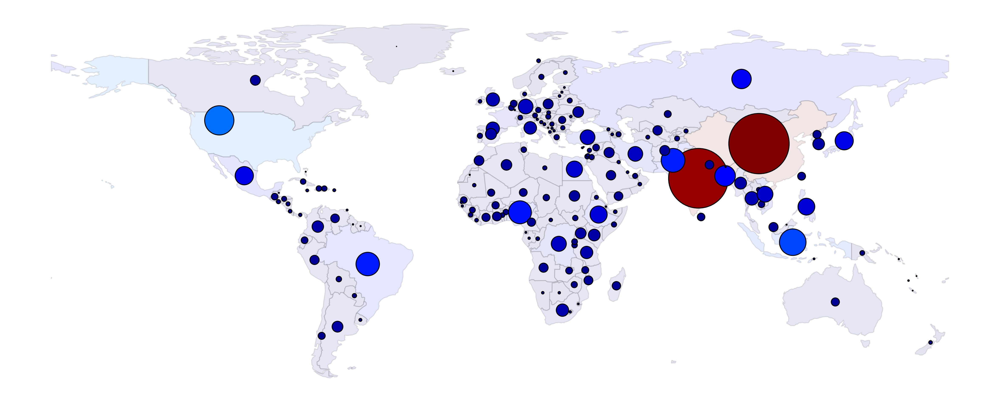

In [113]:
#Plot each country centroid
############################

#gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

gdf = gpd.read_file('World_Map/World_Map.shp')

gdf = gdf.loc[gdf.continent!='Antarctica']


###########
### Try changing CRS
###########

#gdf = gdf.to_crs(6933)
#
#gdf = gdf.to_crs(3857)

#For 5070, filter to just North America:
#gdf = gdf.loc[gdf.continent == 'North America']
#gdf = gdf.to_crs(5070)


#Make a copy...
gdf2 = gdf.copy()

#Get centroids and set as the geometry
gdf2['centroid_column'] = gdf2.centroid

gdf2 = gdf2.set_geometry('centroid_column')

#Plot...
fig, ax1 = plt.subplots(1,1, figsize=(20, 10), dpi=300)

gdf.plot(ax = ax1, column = gdf.pop_est, alpha = .1, linewidth=1, edgecolor = 'black', cmap='jet')
gdf2.plot(ax = ax1, column = gdf2.pop_est, markersize = gdf2.pop_est / 3e5, alpha = 1, edgecolor = 'black', cmap='jet');

ax1.set_axis_off();
    

## Note Pandas Plotting:

- Uses matplotlib
- Can do non-spatial pandas plotting with GeoDataFrames too

Can specify `kind` argument to `plot()` method, with options:

- `bar` or `barh` for bar plots

- `hist` for histogram

- `box` for boxplot

- `kde` or `density` for density plots

- `area` for area plots

- `scatter` for scatter plots

- `hexbin` for hexagonal bin plots

- `pie` for pie plots

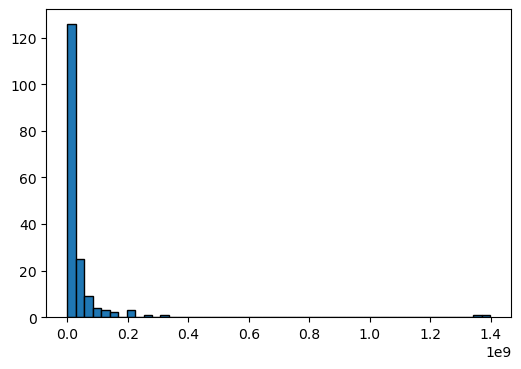

In [114]:
#For example, do a quick histogram of population:
######

fig1, ax1 = plt.subplots(1, 1, figsize=(6,4))

gdf['pop_est'].hist(ax = ax1, bins = 50, edgecolor='black', grid=False);

In [115]:
## We'll do a scatter plot, but first:
## Map continent to a scalar:

c_names = gdf['continent'].unique()

c_map = {c_names[i]:i for i in range(len(c_names))}
c_map

{'Oceania': 0,
 'Africa': 1,
 'North America': 2,
 'Asia': 3,
 'South America': 4,
 'Europe': 5,
 'Seven seas (open ocean)': 6}

In [116]:
## And the mapping:
gdf['c_code'] = gdf['continent'].apply(lambda x: c_map[x])

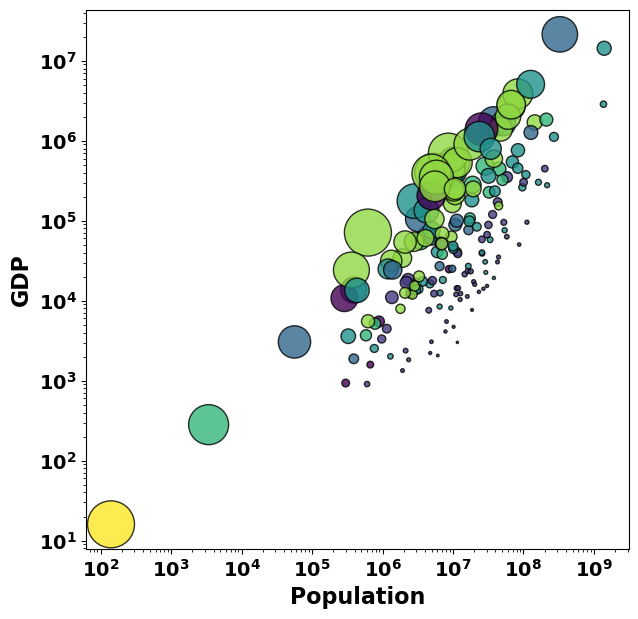

In [117]:
## Compare population and gdp as a scatter plot:
## Use matplotlib directly here:
######

fig1, ax1 = plt.subplots(1, 1, figsize=(7,7))

#Make a log comparison:
#ax1.scatter(np.log(gdf['pop_est']), np.log(gdf['gdp_md_est']))

ax1.scatter(gdf['pop_est'], gdf['gdp_md_est'], c=gdf['c_code'], s=gdf['gdp_md_est']/gdf['pop_est']*1e4,
            edgecolor='black', alpha=.8)


#Label and ticks, etc.:

ax1.set_xlabel('Population', fontsize=16, fontweight='bold')
ax1.set_ylabel('GDP', fontsize=16, fontweight='bold')

ax1.tick_params(axis='both', labelsize=14)

for label in ax1.get_xticklabels():
    label.set_fontweight('bold')
for label in ax1.get_yticklabels():
    label.set_fontweight('bold')
    
#Old version
#ax1.set_xticks(ax1.get_xticks(), weight='bold')

#Can set log scale like this too:
ax1.set_yscale('log');
ax1.set_xscale('log');

## (Consider seaborn for plotting too)

- Also based on matplotlib
- Better base aesthetics(?)
- Good for automatic aggregation/summarization for plotting
- Can do a multitude of regressions

**General classification scheme for basic plotting in seaborn:**

<img src="sns_figure_classes.png" alt="drawing" style="width:500px;"/>

Top categories are **Figure-level**, subcategories are **Axis-level**


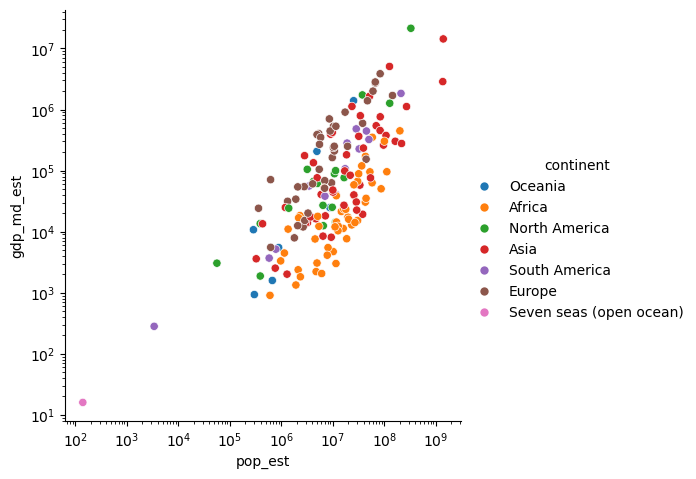

In [119]:
## Example of a relplot:
#######
import seaborn as sns

#Figure-level function:

sns.relplot(data=gdf, x="pop_est", y='gdp_md_est', hue="continent") #, multiple="layer", kind='hist');
plt.xscale('log')
plt.yscale('log')

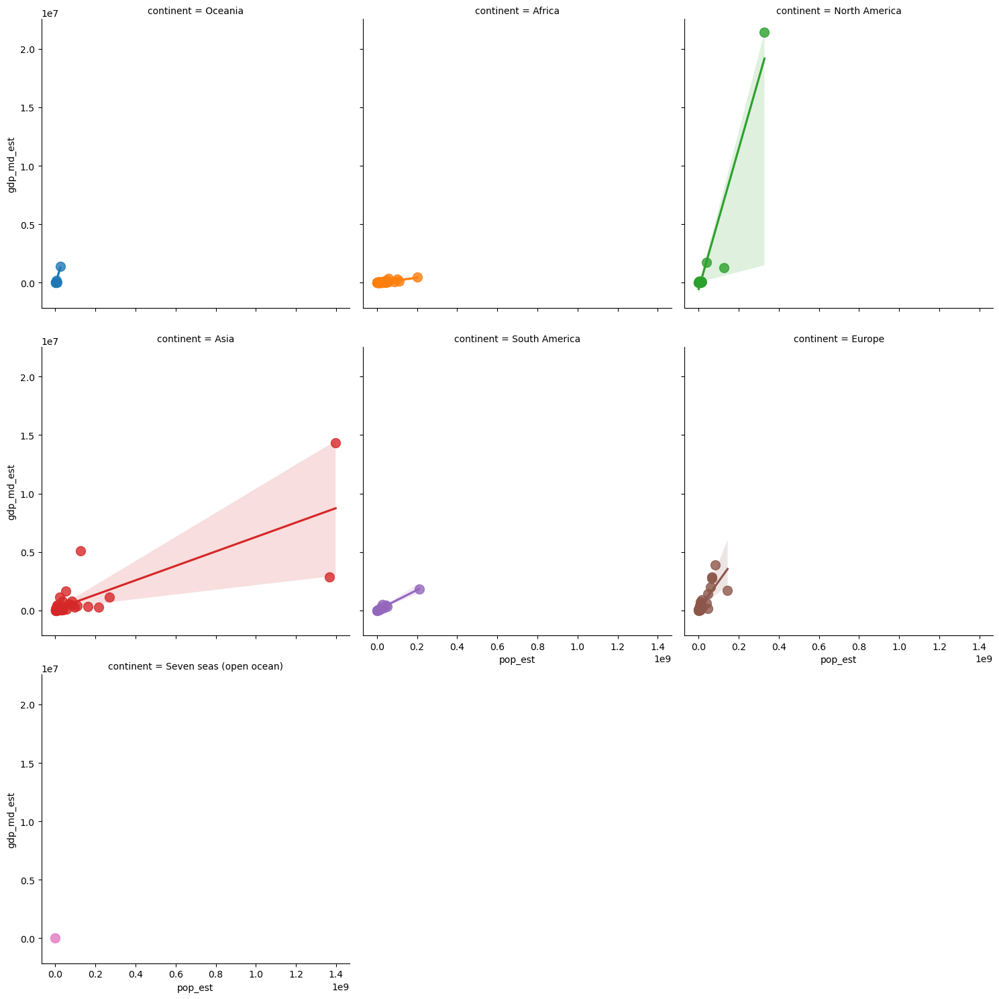

In [120]:
#And add regression lines:

sns.lmplot(data=gdf, x="pop_est", y='gdp_md_est', hue="continent", col='continent', col_wrap=3,
           order=1, ci=95, scatter_kws={"s": 100})

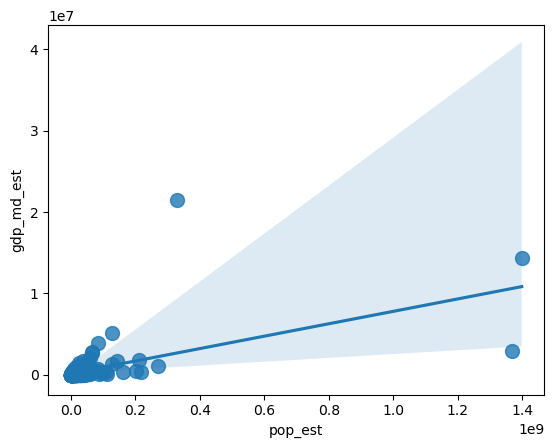

In [121]:
## Or regplot: Axis-level

sns.regplot(data=gdf, x="pop_est", y='gdp_md_est',
           order=1, ci=95, scatter_kws={"s": 100});


## Pivoting wide and long (i.e., melt and pivot):

- Let's make a pie chart of population by continent
- Then pivot the underlying data between wide and long format

In [ ]:
## Had from above:
gdf_continent


In [ ]:
## Let's reset the index and just keep continent and pop_est:

df_pie = gdf_continent.reset_index()[['continent', 'pop_est']]
df_pie

In [ ]:
#And a pie chart:

df_pie.plot.pie(y = 'pop_est', figsize=(6,6))

#Oops, labels are wrong


In [ ]:
#Continent back to the index:
df_pie2 = df_pie.set_index('continent')

df_pie2

In [ ]:
#And again

fig1, ax1 = plt.subplots(1,1, figsize=(7,7))

df_pie2.plot.pie(y = 'pop_est', fontsize=11, ax=ax1, cmap='Reds_r', autopct='%.1f%%')

#Some more aesthetics
ax1.legend(fontsize=12, loc='upper right', bbox_to_anchor=(1.2, 1.1))
ax1.set_ylabel('Population', fontsize=12);


In [ ]:
## Above DataFrame is in long format, to *pivot* to wide format:
####

#Make a dummy variable for the pivoting:
df_pie['dummy'] = 0

df_wide = pd.pivot(df_pie, index=['dummy'], columns='continent', values='pop_est')
df_wide

In [ ]:
#*Melt* back to long format:
######

df_long = pd.melt(df_wide, value_vars=df_wide.columns[:],
        var_name='Continent', value_name='Population')

df_long

# Loading & Manipulating US Maps

Let's introduce Census shapefiles for counties (and states):

- Restrict to CONUS
- **Merge** US Census demographic data


## Census Shapefiles

Consider the ESRI shapefile (shp):

- Multiple files in single folder
- Variable names limited to 10 characters
- Can load directly from url with geopandas...

In [122]:
#Get shapefile data directly from census URLs: Could do both counties and states, we'll just do counties
#########

#Load the counties and states:
#URLs:
url_county = 'https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_county_500k.zip'
#url_state = 'https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_state_500k.zip'


#Downloaded locally
url_county = 'cb_2021_us_county_500k.zip'

#Lines to load:
county_gdf = gpd.read_file(url_county)

#state_gdf = gpd.read_file(url_state)

In [123]:
#Check out the counties
county_gdf.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,STATE_NAME,LSAD,ALAND,AWATER,geometry
0,20,161,00485044,0500000US20161,20161,Riley,Riley County,KS,Kansas,06,1579077672,32047392,"POLYGON ((-96.96095 39.2867, -96.96106 39.2885..."
1,19,159,00465268,0500000US19159,19159,Ringgold,Ringgold County,IA,Iowa,06,1386932347,8723135,"POLYGON ((-94.47167 40.81254, -94.47166 40.819..."
2,30,009,01720111,0500000US30009,30009,Carbon,Carbon County,MT,Montana,06,5303728455,35213028,"POLYGON ((-109.79867 45.16734, -109.68779 45.1..."
3,16,007,00395090,0500000US16007,16007,Bear Lake,Bear Lake County,ID,Idaho,06,2527123155,191364281,"POLYGON ((-111.63452 42.57034, -111.6301 42.57..."
4,55,011,01581065,0500000US55011,55011,Buffalo,Buffalo County,WI,Wisconsin,06,1750290818,87549529,"POLYGON ((-92.08384 44.412, -92.0831 44.41426,..."


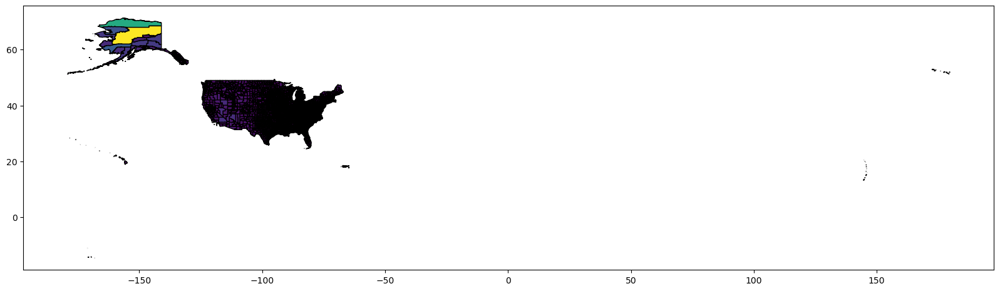

In [124]:
#And a quick plot
fig, my_ax = plt.subplots(1,1, figsize=(20, 10))

county_gdf.plot(ax = my_ax, linewidth = 1, edgecolor = 'black', column = 'ALAND');

#### Note the CRS:

In [125]:
county_gdf.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

In [126]:
## Let's convert CRS to North American Albers, EPSG 5070
##########

county_gdf = county_gdf.to_crs(5070)

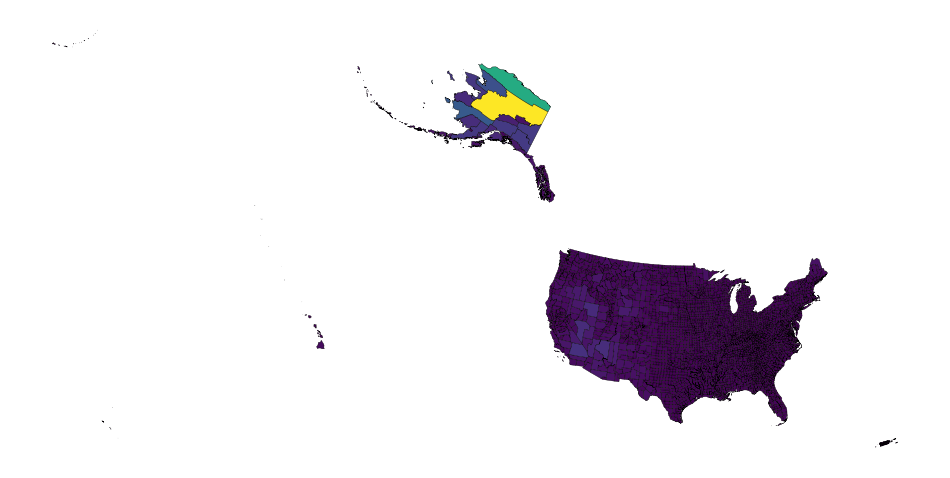

In [127]:
#Plot the result!
##########
fig, ax1 = plt.subplots(1,1, figsize=(12, 8))

#Draw the counties:
county_gdf.plot(ax = ax1, linewidth = .25, edgecolor = 'black', column = 'ALAND')

ax1.set_axis_off()

### Restrict to the Contiguous US (CONUS):

In [128]:
#We can exclude everthing outside the contiguous US:
#########

#Hawaii = 15, Alasksa = 02, Puerto Rico = 72
#Guam = 66, Northern Mariana Islands = 69, American Samoa = 60, Virgin Islands = 78

#Note the astype('int') method:
#Could do:
#state_gdf = state_gdf.loc[(state_gdf.STATEFP.astype(int) != 15) & 
#                           (state_gdf.STATEFP.astype(int) != 72) &
#                           (state_gdf.STATEFP.astype(int) != 2) &
#                           (state_gdf.STATEFP.astype(int) != 60) &
#                           (state_gdf.STATEFP.astype(int) != 66) &
#                           (state_gdf.STATEFP.astype(int) != 69) &
#                           (state_gdf.STATEFP.astype(int) != 78)]

#Or, more compactly:
exclude_list = [15, 72, 2, 60, 66, 69, 78]

#~ is not
county_gdf = county_gdf.loc[~county_gdf['STATEFP'].astype(int).isin(exclude_list)]

#state_gdf = state_gdf.loc[~state_gdf['STATEFP'].astype(int).isin(exclude_list)]

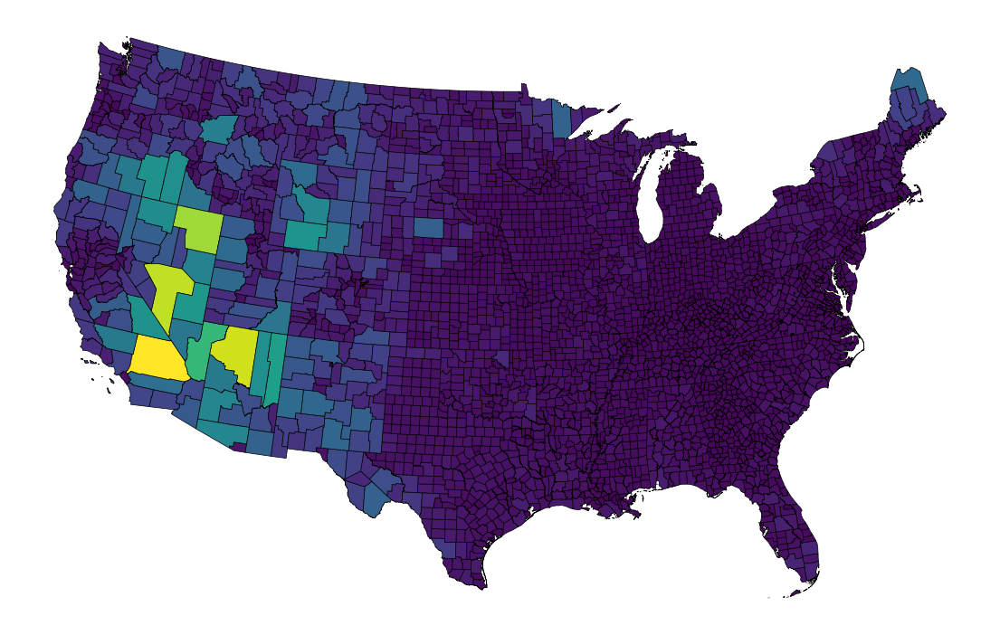

In [129]:
#And triumphantly plot again
##########
fig, ax1 = plt.subplots(1,1, figsize=(14, 10))

#Draw the counties:
county_gdf.plot(ax = ax1, linewidth = .5, edgecolor = 'black', column = 'ALAND')

ax1.set_axis_off()

### Use `Dissolve()` to Make a State GeoDataFrame

- Pass a dictionary to `aggfunc` to sum over `ALAND` and `AWATER`, but take the first entry for `STUSPS`
- Reset the index
- Make a quick choropleth plot coded by state land area

In [130]:
##Our lovely dissolve:

state_gdf = county_gdf.dissolve(by='STATEFP', aggfunc={'ALAND':'sum', 'AWATER':'sum', 'STUSPS':'first'})

In [131]:
state_gdf.head()

,geometry,ALAND,AWATER,STUSPS
STATEFP,,,,
01,"MULTIPOLYGON (((746349.596 827181.513, 748515....",131175477769,4591897964,AL
04,"POLYGON ((-1456521.134 1049554.379, -1466081.1...",294363973043,855871553,AZ
05,"POLYGON ((271938.335 1109471.096, 271707.724 1...",134660767709,3121950081,AR
06,"MULTIPOLYGON (((-2274108.826 1816768.259, -227...",403671756816,20293573058,CA
08,"POLYGON ((-879811.915 1596563.386, -880588.238...",268418796417,1185716938,CO


In [132]:
state_gdf = state_gdf.reset_index()
state_gdf.head()

,STATEFP,geometry,ALAND,AWATER,STUSPS
0,01,"MULTIPOLYGON (((746349.596 827181.513, 748515....",131175477769,4591897964,AL
1,04,"POLYGON ((-1456521.134 1049554.379, -1466081.1...",294363973043,855871553,AZ
2,05,"POLYGON ((271938.335 1109471.096, 271707.724 1...",134660767709,3121950081,AR
3,06,"MULTIPOLYGON (((-2274108.826 1816768.259, -227...",403671756816,20293573058,CA
4,08,"POLYGON ((-879811.915 1596563.386, -880588.238...",268418796417,1185716938,CO


<Axes: >

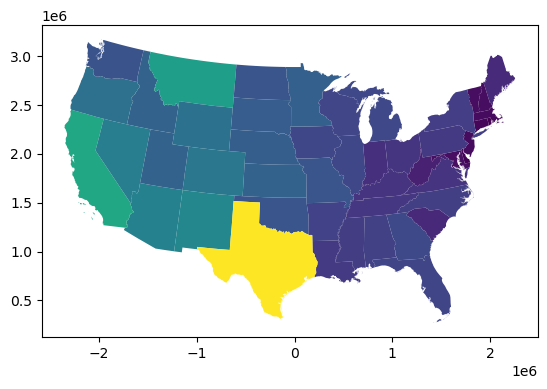

In [133]:
#Quick plot to confirm work:
state_gdf.plot(column='ALAND')

#### FIPS

Note that each county has a `STATEFP` and a `COUNTYFP`.  We can concatenate these into a single FIPS, to uniquely identify each county and make for easy merging with other data...

In [ ]:
#We can make a single FIPS like so: Concatenate strings:
county_gdf['FIPS'] = county_gdf.STATEFP + county_gdf.COUNTYFP

In [ ]:
#Quick Check
list(county_gdf['FIPS'])

#### Example of Arizona

In [136]:
display(county_gdf.loc[county_gdf.STATEFP == '04'].head(20))

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,STATE_NAME,LSAD,ALAND,AWATER,geometry,FIPS
158,04,015,00025445,0500000US04015,04015,Mohave,Mohave County,AZ,Arizona,06,34530024782,333401646,"POLYGON ((-1662579.799 1613337.218, -1662182.2...",04015
331,04,005,00025443,0500000US04005,04005,Coconino,Coconino County,AZ,Arizona,06,48216135500,116631423,"POLYGON ((-1540947.192 1584540.288, -1540653.1...",04005
487,04,007,00040471,0500000US04007,04007,Gila,Gila County,AZ,Arizona,06,12322070149,96465330,"POLYGON ((-1431927.361 1351869, -1431823.324 1...",04007
588,04,025,00042809,0500000US04025,04025,Yavapai,Yavapai County,AZ,Arizona,06,21038299574,11356180,"POLYGON ((-1566881.176 1434000.043, -1566805.7...",04025
641,04,027,00023901,0500000US04027,04027,Yuma,Yuma County,AZ,Arizona,06,14280774791,13253159,"POLYGON ((-1746851.979 1221914.112, -1746649.6...",04027
937,04,021,00025447,0500000US04021,04021,Pinal,Pinal County,AZ,Arizona,06,13899612888,20747424,"POLYGON ((-1506275.421 1180500.226, -1506270.4...",04021
1166,04,009,00025444,0500000US04009,04009,Graham,Graham County,AZ,Arizona,06,11970605955,47476264,"POLYGON ((-1332458.371 1237801.718, -1332047.1...",04009
1216,04,013,00037026,0500000US04013,04013,Maricopa,Maricopa County,AZ,Arizona,06,23833061798,62173467,"POLYGON ((-1589798.482 1310318.916, -1589513.9...",04013
1260,04,001,00025441,0500000US04001,04001,Apache,Apache County,AZ,Arizona,06,29003491828,54145120,"POLYGON ((-1229881.129 1641289.79, -1229880.91...",04001
1351,04,012,00043540,0500000US04012,04012,La Paz,La Paz County,AZ,Arizona,06,11646086700,36514200,"POLYGON ((-1721663.073 1307456.053, -1721506.2...",04012


<Axes: >

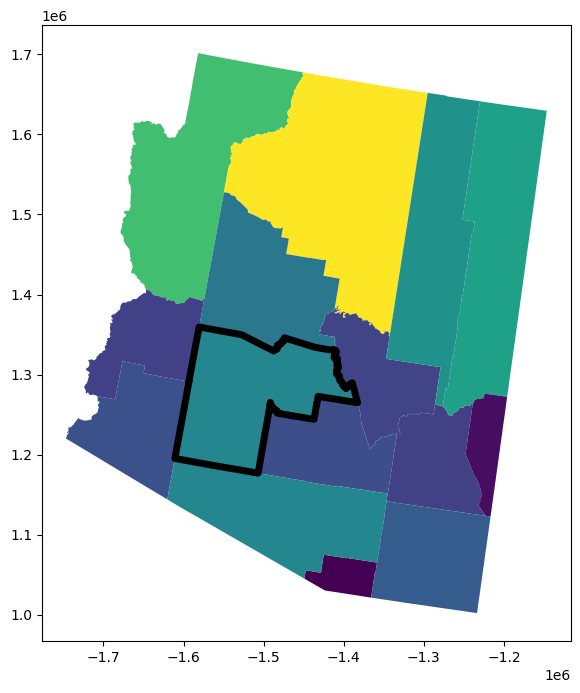

In [137]:
#Example: Arizona:

fig, ax1 = plt.subplots(1,1, figsize=(12, 8))

#Show Arizona, Highlight Maricopa:
county_gdf.loc[county_gdf.STATEFP == '04'].plot(ax = ax1, column = 'ALAND')
county_gdf.loc[county_gdf.FIPS == '04013'].plot(ax = ax1, linewidth = 5, edgecolor = 'black', facecolor='none')

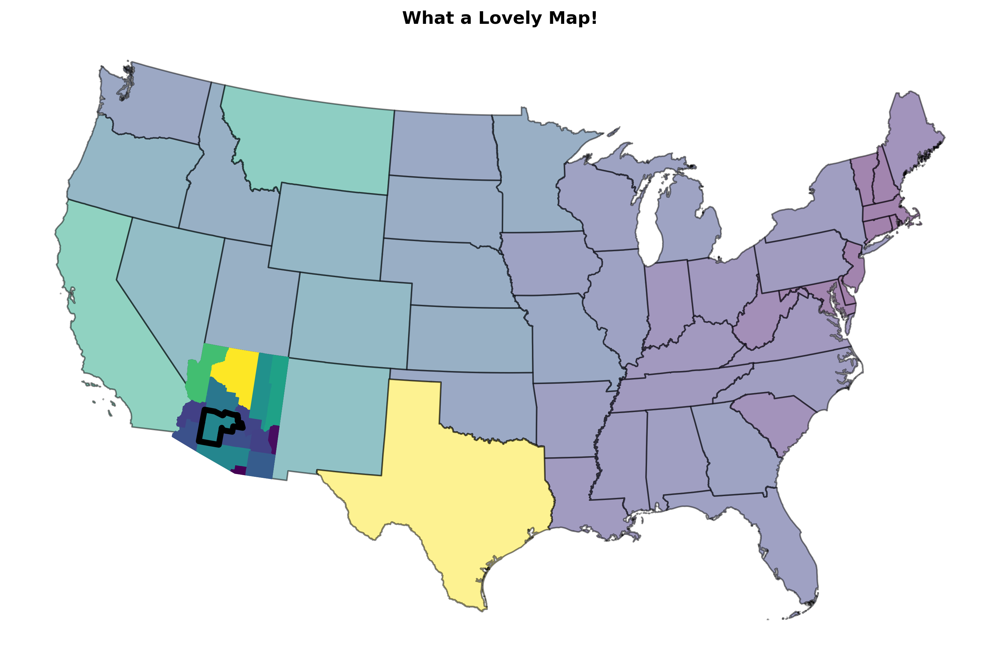

In [138]:
#Highlight Arizona and Maricopa County on National Map Background:

fig, ax1 = plt.subplots(1,1, figsize=(12, 8), dpi=300)

state_gdf.plot(ax = ax1, edgecolor = 'black', column = 'ALAND', alpha=.5)
county_gdf.loc[county_gdf.STATEFP == '04'].plot(ax = ax1, column = 'ALAND', edgecolor='face')
county_gdf.loc[county_gdf.FIPS == '04013'].plot(ax = ax1, linewidth = 4, edgecolor = 'black', facecolor='none')

ax1.set_axis_off()
ax1.set_title('What a Lovely Map!', fontweight='bold');


## Merging Census Demographic Data

- Load Census dataset with county-level demographic data, add FIPS code
- Merge, plot

In [139]:
#Here's our URL:
#url_name = r'https://www2.census.gov/programs-surveys/popest/datasets/2010-2020/counties/totals/co-est2020-alldata.csv'

#Again, downloaded locally:
url_name = 'co-est2020-alldata.csv'

#Note the encoding:
df = pd.read_csv(url_name, encoding = "ISO-8859-1", engine='python')

df.head()


,SUMLEV,REGION,DIVISION,STATE,COUNTY,STNAME,CTYNAME,CENSUS2010POP,ESTIMATESBASE2010,POPESTIMATE2010,...,RNETMIG2011,RNETMIG2012,RNETMIG2013,RNETMIG2014,RNETMIG2015,RNETMIG2016,RNETMIG2017,RNETMIG2018,RNETMIG2019,RNETMIG2020
0,40,3,6,1,0,Alabama,Alabama,4779736,4780118,4785514,...,0.680010,1.282825,1.614391,0.653828,0.730419,0.854384,1.197150,1.966095,2.677866,3.091308
1,50,3,6,1,1,Alabama,Autauga County,54571,54582,54761,...,6.236931,-5.971016,-3.773344,2.206640,-1.529706,4.954403,0.993228,-0.018021,3.486011,6.290545
2,50,3,6,1,3,Alabama,Baldwin County,182265,182263,183121,...,16.705437,17.670696,22.924288,20.300088,17.902273,21.436499,22.476720,24.846335,25.242507,26.401562
3,50,3,6,1,5,Alabama,Barbour County,27457,27454,27325,...,0.329254,-6.860371,-8.093425,-5.063857,-15.677998,-18.377839,-25.138734,-8.790155,-6.257064,0.649799
4,50,3,6,1,7,Alabama,Bibb County,22915,22904,22858,...,-4.912927,-3.789130,-5.800695,1.420612,1.286202,-0.841769,-3.235672,-7.271592,0.268980,-7.199262


In [140]:
df.dtypes

SUMLEV           int64
REGION           int64
DIVISION         int64
STATE            int64
COUNTY           int64
                ...   
RNETMIG2016    float64
RNETMIG2017    float64
RNETMIG2018    float64
RNETMIG2019    float64
RNETMIG2020    float64
Length: 180, dtype: object

In [141]:
#Let's list the columns:
#########

list(df.columns)

['SUMLEV',
 'REGION',
 'DIVISION',
 'STATE',
 'COUNTY',
 'STNAME',
 'CTYNAME',
 'CENSUS2010POP',
 'ESTIMATESBASE2010',
 'POPESTIMATE2010',
 'POPESTIMATE2011',
 'POPESTIMATE2012',
 'POPESTIMATE2013',
 'POPESTIMATE2014',
 'POPESTIMATE2015',
 'POPESTIMATE2016',
 'POPESTIMATE2017',
 'POPESTIMATE2018',
 'POPESTIMATE2019',
 'POPESTIMATE2020',
 'NPOPCHG_2010',
 'NPOPCHG_2011',
 'NPOPCHG_2012',
 'NPOPCHG_2013',
 'NPOPCHG_2014',
 'NPOPCHG_2015',
 'NPOPCHG_2016',
 'NPOPCHG_2017',
 'NPOPCHG_2018',
 'NPOPCHG_2019',
 'NPOPCHG_2020',
 'BIRTHS2010',
 'BIRTHS2011',
 'BIRTHS2012',
 'BIRTHS2013',
 'BIRTHS2014',
 'BIRTHS2015',
 'BIRTHS2016',
 'BIRTHS2017',
 'BIRTHS2018',
 'BIRTHS2019',
 'BIRTHS2020',
 'DEATHS2010',
 'DEATHS2011',
 'DEATHS2012',
 'DEATHS2013',
 'DEATHS2014',
 'DEATHS2015',
 'DEATHS2016',
 'DEATHS2017',
 'DEATHS2018',
 'DEATHS2019',
 'DEATHS2020',
 'NATURALINC2010',
 'NATURALINC2011',
 'NATURALINC2012',
 'NATURALINC2013',
 'NATURALINC2014',
 'NATURALINC2015',
 'NATURALINC2016',
 'NATURALIN

In [142]:
#Consider our identifiers:
df.COUNTY

0        0
1        1
2        3
3        5
4        7
        ..
3189    37
3190    39
3191    41
3192    43
3193    45
Name: COUNTY, Length: 3194, dtype: int64

In [143]:
df.COUNTY.astype(str)

0        0
1        1
2        3
3        5
4        7
        ..
3189    37
3190    39
3191    41
3192    43
3193    45
Name: COUNTY, Length: 3194, dtype: object

In [144]:
#Let's construct a FIPS for df, using zfill:
#This will give us a leading 0:
df.COUNTY.astype(str).str.zfill(3)

0       000
1       001
2       003
3       005
4       007
       ... 
3189    037
3190    039
3191    041
3192    043
3193    045
Name: COUNTY, Length: 3194, dtype: object

### Merging and Plotting:

1. Create the FIPS (a 5-digit string)
2. Merge with the county shapefiles
3. Plot both county population and county population as choropleth maps
4. Make a bubble plot of county population, using centroids as the geometry

In [145]:
#Now create the FIPS:
#####################

df['FIPS'] = df['STATE'].astype(str).str.zfill(2) + df['COUNTY'].astype(str).str.zfill(3)
df['FIPS']

0       01000
1       01001
2       01003
3       01005
4       01007
        ...  
3189    56037
3190    56039
3191    56041
3192    56043
3193    56045
Name: FIPS, Length: 3194, dtype: object

### Merging DataFrames with `merge`

- Merging is one of the most common operations you will do, and is especially important for merging non-spatial and spatial DataFrames

- We will generally join on one or more **keys**: Can be columns, or can merge on the index

- Joins can be **left**, **right**, or **inner**

- Merging for DataFrames and GeoDataFrames is very similar

In [146]:
#And merge shapefiles with demographic data:
#####################

gdf_county_all = county_gdf.merge(df, on='FIPS', how='left') #left_on='FIPS', right_on='FIPS'

gdf_county_all

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,STATE_NAME,LSAD,...,RNETMIG2011,RNETMIG2012,RNETMIG2013,RNETMIG2014,RNETMIG2015,RNETMIG2016,RNETMIG2017,RNETMIG2018,RNETMIG2019,RNETMIG2020
0,20,161,00485044,0500000US20161,20161,Riley,Riley County,KS,Kansas,06,...,15.351089,41.710267,-17.755806,-15.928005,0.662927,-34.336170,-24.320582,3.235877,-34.880885,-0.369954
1,19,159,00465268,0500000US19159,19159,Ringgold,Ringgold County,IA,Iowa,06,...,-5.314438,-0.198551,-6.002401,0.604108,9.055237,5.816286,10.575676,-14.673367,-6.743640,-9.516913
2,30,009,01720111,0500000US30009,30009,Carbon,Carbon County,MT,Montana,06,...,2.282652,6.920073,20.703125,10.011552,0.383840,13.024325,20.598101,0.281149,4.588659,21.272660
3,16,007,00395090,0500000US16007,16007,Bear Lake,Bear Lake County,ID,Idaho,06,...,-2.514037,-12.818350,5.569620,-6.226860,-10.665312,4.398207,11.195589,-1.493156,12.996627,0.162946
4,55,011,01581065,0500000US55011,55011,Buffalo,Buffalo County,WI,Wisconsin,06,...,-6.742739,-9.557588,-1.123133,-9.022217,-2.265947,-10.684651,-1.294597,1.676765,-7.881246,2.534076
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3103,53,003,01533502,0500000US53003,53003,Asotin,Asotin County,WA,Washington,06,...,10.158091,-1.457228,11.065258,2.522409,-2.432323,10.465090,12.362698,5.340866,0.705063,8.526161
3104,13,043,00342852,0500000US13043,13043,Candler,Candler County,GA,Georgia,06,...,14.676751,-12.203329,-16.696915,-9.906894,2.394438,0.184323,-12.723473,11.900888,-0.554324,13.932172
3105,48,451,01384011,0500000US48451,48451,Tom Green,Tom Green County,TX,Texas,06,...,5.026165,9.063243,7.218285,9.901590,4.496880,-3.799147,-3.923783,1.440409,6.006865,1.712336
3106,39,089,01074057,0500000US39089,39089,Licking,Licking County,OH,Ohio,06,...,-0.131768,0.131410,2.843816,3.265905,5.343491,6.031141,7.567436,10.354513,5.937845,4.317794


<Axes: >

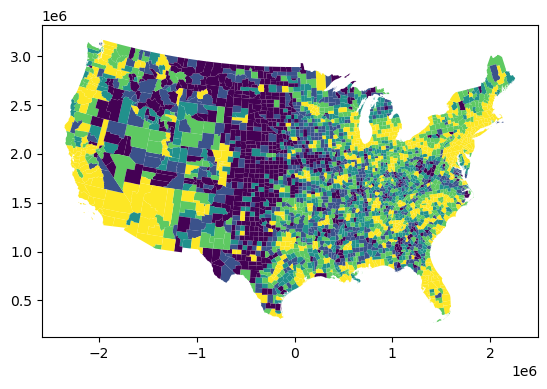

In [147]:
#Quickly plot county population
#####################

gdf_county_all.plot(column = 'POPESTIMATE2020', cmap='viridis', scheme='quantiles')


<Axes: >

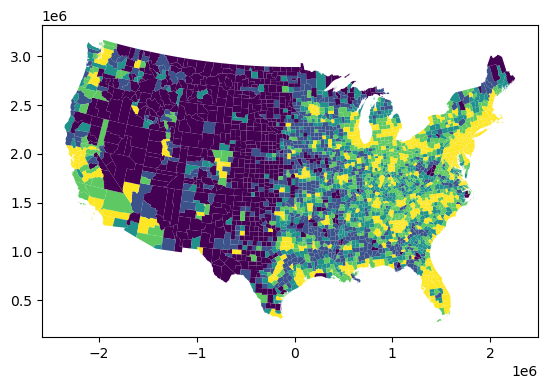

In [148]:
#Plot county population density
#####################

gdf_county_all.plot(column = gdf_county_all.POPESTIMATE2020 / gdf_county_all.ALAND, cmap='viridis', scheme='quantiles')


In [149]:
## Centroids and bubble plot:
########

In [150]:
gdf_county_all['cent'] = gdf_county_all.centroid

In [151]:
gdf_county_all = gdf_county_all.set_geometry('cent')

<Axes: >

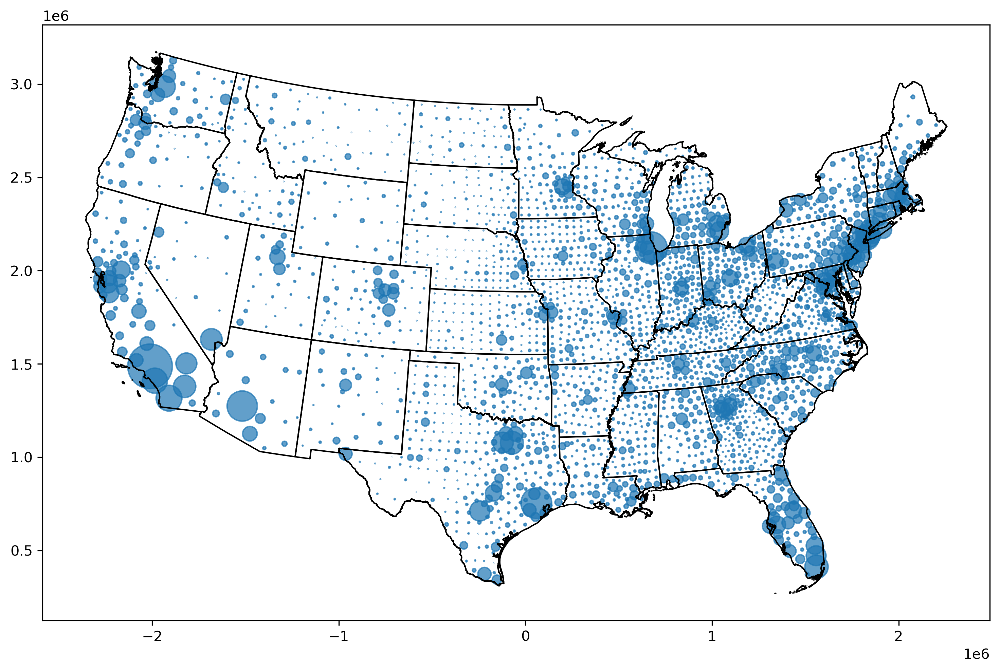

In [152]:
#Plot county population as bubble plot using centroids
#####################

fig, ax1 = plt.subplots(1,1, figsize=(12, 8), dpi=300)

gdf_county_all.plot(ax=ax1, markersize = gdf_county_all.POPESTIMATE2020 / 1e4, alpha=.7) #column = gdf_county_all.POPESTIMATE2020)
state_gdf.plot(ax=ax1, facecolor='none')


### Dissolve/groupby by Census Division:

- One more example of dissolving/groupby:

In [ ]:
gdf_division = gdf_county_all.dissolve(by = 'DIVISION', aggfunc='sum', numeric_only=True)
gdf_division.head()

In [ ]:
## Note that any rates are no longer reliable
## Need to re-derive death rates:
####

gdf_division.plot(column=gdf_division['DEATHS2020'] / gdf_division['POPESTIMATE2020'])